# **Project Title:** Age and Gender Detection : Blurring - Based approach

# **Models Used:**

**Face Detection:**

*   Pre-trained OpenCV DNN model.


*   Age and Gender Prediction: Pre-trained Caffe models.

**Blurring Techniques:**

*  Gaussian Blur: Reduces noise while maintaining smoothness.

*  Bilateral Filter: Maintains edges during blurring.


In [1]:
!git clone https://github.com/misbah4064/age_and_gender_detection.git
%cd age_and_gender_detection

Cloning into 'age_and_gender_detection'...
remote: Enumerating objects: 11, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 11 (delta 1), reused 0 (delta 0), pack-reused 9 (from 1)
Receiving objects: 100% (11/11), 1.33 MiB | 3.39 MiB/s, done.
Resolving deltas: 100% (1/1), done.
/content/age_and_gender_detection


In [2]:
# Downloading pretrained data and unzipping it
!gdown https://drive.google.com/uc?id=1_aDScOvBeBLCn_iv0oxSO8X1ySQpSbIS
# https://drive.google.com/uc?id=1_aDScOvBeBLCn_iv0oxSO8X1ySQpSbIS
!unzip modelNweight.zip

Downloading...
From (original): https://drive.google.com/uc?id=1_aDScOvBeBLCn_iv0oxSO8X1ySQpSbIS
From (redirected): https://drive.google.com/uc?id=1_aDScOvBeBLCn_iv0oxSO8X1ySQpSbIS&confirm=t&uuid=15dc2cea-e972-476c-8c8a-0b34c8890d83
To: /content/age_and_gender_detection/modelNweight.zip
100% 86.2M/86.2M [00:02<00:00, 40.6MB/s]
Archive:  modelNweight.zip
   creating: modelNweight/
  inflating: modelNweight/age_deploy.prototxt  
  inflating: modelNweight/age_net.caffemodel  
  inflating: modelNweight/gender_deploy.prototxt  
  inflating: modelNweight/gender_net.caffemodel  
  inflating: modelNweight/opencv_face_detector.pbtxt  
  inflating: modelNweight/opencv_face_detector_uint8.pb  


In [3]:
!pip install pandas

# **Objective 1:**

## To develop a system that predicts gender and age range from facial images, utilizing techniques like Gaussian Blur to enhance image quality by reducing noise.

Saving ssr2_gb.png to ssr2_gb.png
Saving APJ.webp to APJ.webp
Original Image: ssr2_gb.png


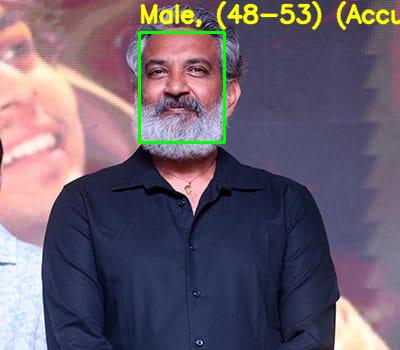

Output Before Blurring:


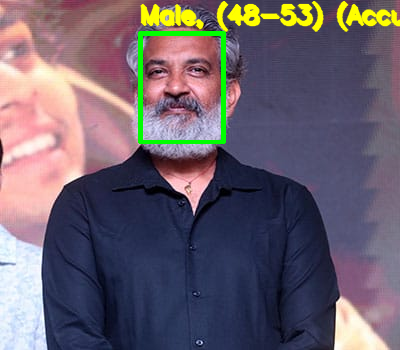

Output After Blurring:


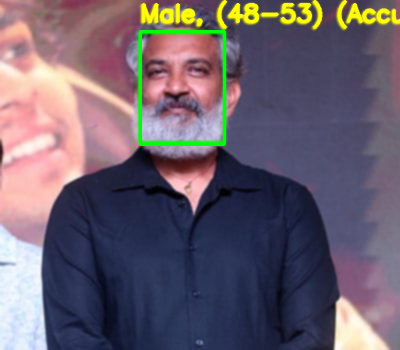

Original Image: APJ.webp


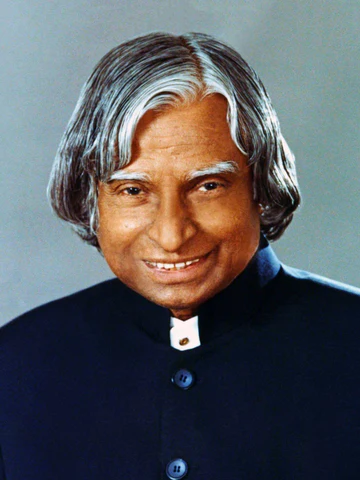

Output Before Blurring:


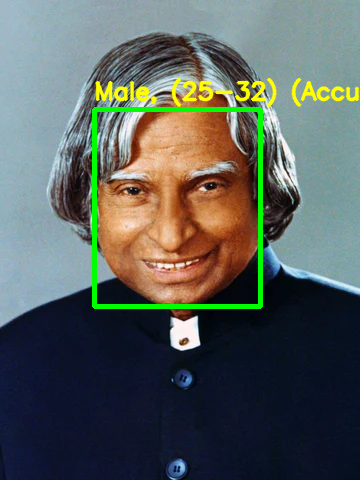

Output After Blurring:


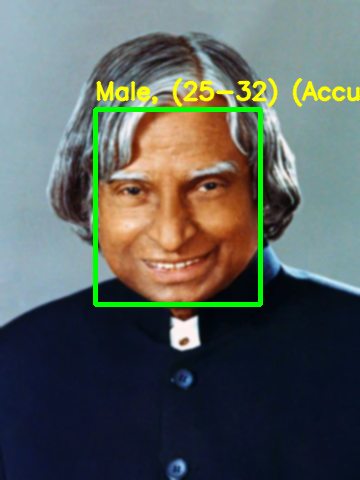


Comparison of Results Before and After Gaussian Blurring:

Table 1: Results Before Blurring
         Image Gender      Age  Accuracy (%)
1  ssr2_gb.png   Male  (48-53)         82.27
2     APJ.webp   Male  (25-32)         99.63

Table 2: Results After Blurring
         Image Gender      Age  Accuracy (%)
1  ssr2_gb.png   Male  (48-53)         84.61
2     APJ.webp   Male  (25-32)         99.72


In [4]:
# Import required libraries
import cv2 as cv
import time
import pandas as pd
from google.colab.patches import cv2_imshow
from google.colab import files

# Initialize lists to store unique results for before and after blurring
results_before = []
results_after = []

def getFaceBox(net, frame, conf_threshold=0.7):
    frameOpencvDnn = frame.copy()
    frameHeight = frameOpencvDnn.shape[0]
    frameWidth = frameOpencvDnn.shape[1]
    blob = cv.dnn.blobFromImage(frameOpencvDnn, 1.0, (300, 300), [104, 117, 123], True, False)

    net.setInput(blob)
    detections = net.forward()
    bboxes = []
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > conf_threshold:
            x1 = int(detections[0, 0, i, 3] * frameWidth)
            y1 = int(detections[0, 0, i, 4] * frameHeight)
            x2 = int(detections[0, 0, i, 5] * frameWidth)
            y2 = int(detections[0, 0, i, 6] * frameHeight)
            bboxes.append([x1, y1, x2, y2])
            cv.rectangle(frameOpencvDnn, (x1, y1), (x2, y2), (0, 255, 0), int(round(frameHeight / 150)), 8)
    return frameOpencvDnn, bboxes

# Model paths
faceProto = "modelNweight/opencv_face_detector.pbtxt"
faceModel = "modelNweight/opencv_face_detector_uint8.pb"
ageProto = "modelNweight/age_deploy.prototxt"
ageModel = "modelNweight/age_net.caffemodel"
genderProto = "modelNweight/gender_deploy.prototxt"
genderModel = "modelNweight/gender_net.caffemodel"

# Mean values and labels
MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746)
ageList = ['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
genderList = ['Male', 'Female']

# Load networks
ageNet = cv.dnn.readNet(ageModel, ageProto)
genderNet = cv.dnn.readNet(genderModel, genderProto)
faceNet = cv.dnn.readNet(faceModel, faceProto)

padding = 20

def age_gender_detector(frame, img_name, results_list):
    frameFace, bboxes = getFaceBox(faceNet, frame)

    for bbox in bboxes:
        face = frame[max(0, bbox[1]-padding):min(bbox[3]+padding, frame.shape[0]-1),
                     max(0, bbox[0]-padding):min(bbox[2]+padding, frame.shape[1]-1)]

        blob = cv.dnn.blobFromImage(face, 1.0, (227, 227), MODEL_MEAN_VALUES, swapRB=False)

        genderNet.setInput(blob)
        genderPreds = genderNet.forward()
        gender = genderList[genderPreds[0].argmax()]
        gender_confidence = genderPreds[0].max()

        ageNet.setInput(blob)
        agePreds = ageNet.forward()
        age = ageList[agePreds[0].argmax()]
        age_confidence = agePreds[0].max()

        accuracy_percentage = round((gender_confidence + age_confidence) / 2 * 100, 2)

        if not any((result['Image'] == img_name and result['Gender'] == gender and result['Age'] == age)
                   for result in results_list):
            results_list.append({
                "Image": img_name,
                "Gender": gender,
                "Age": age,
                "Accuracy (%)": accuracy_percentage
            })

        label = f"{gender}, {age} (Accuracy: {accuracy_percentage}%)"
        cv.putText(frameFace, label, (bbox[0], bbox[1]-10), cv.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 255), 2, cv.LINE_AA)

    return frameFace

def upload_images():
    uploaded = files.upload()
    images = []
    for filename in uploaded.keys():
        img = cv.imread(filename)
        images.append((img, filename))
    return images

def display_results():
    df_before = pd.DataFrame(results_before)
    df_after = pd.DataFrame(results_after)

    df_before.index += 1
    df_after.index += 1

    print("\nTable 1: Results Before Blurring")
    print(df_before.to_string(index=True))

    print("\nTable 2: Results After Blurring")
    print(df_after.to_string(index=True))

input_images = upload_images()

for input_image, input_filename in input_images:
    if input_image is None:
        print(f"Error: Could not load the image {input_filename}.")
        continue

    print(f"Original Image: {input_filename}")
    cv2_imshow(input_image)

    output_before = age_gender_detector(input_image, img_name=input_filename, results_list=results_before)

    print("Output Before Blurring:")
    cv2_imshow(output_before)

    blurred_image = cv.GaussianBlur(input_image, (5, 5), 0)
    output_after = age_gender_detector(blurred_image, img_name=input_filename, results_list=results_after)

    print("Output After Blurring:")
    cv2_imshow(output_after)

print("\nComparison of Results Before and After Gaussian Blurring:")
display_results()


# **Objective 2 :**

# To analyze the impact of Gaussian and bilateral blurring on improving the accuracy and confidence of age and gender detection models, particularly for low-confidence predictions.

Saving Modi.webp to Modi.webp
Saving girl1.jpg to girl1.jpg
Saving kid1.jpg to kid1.jpg
Original Image: Modi.webp


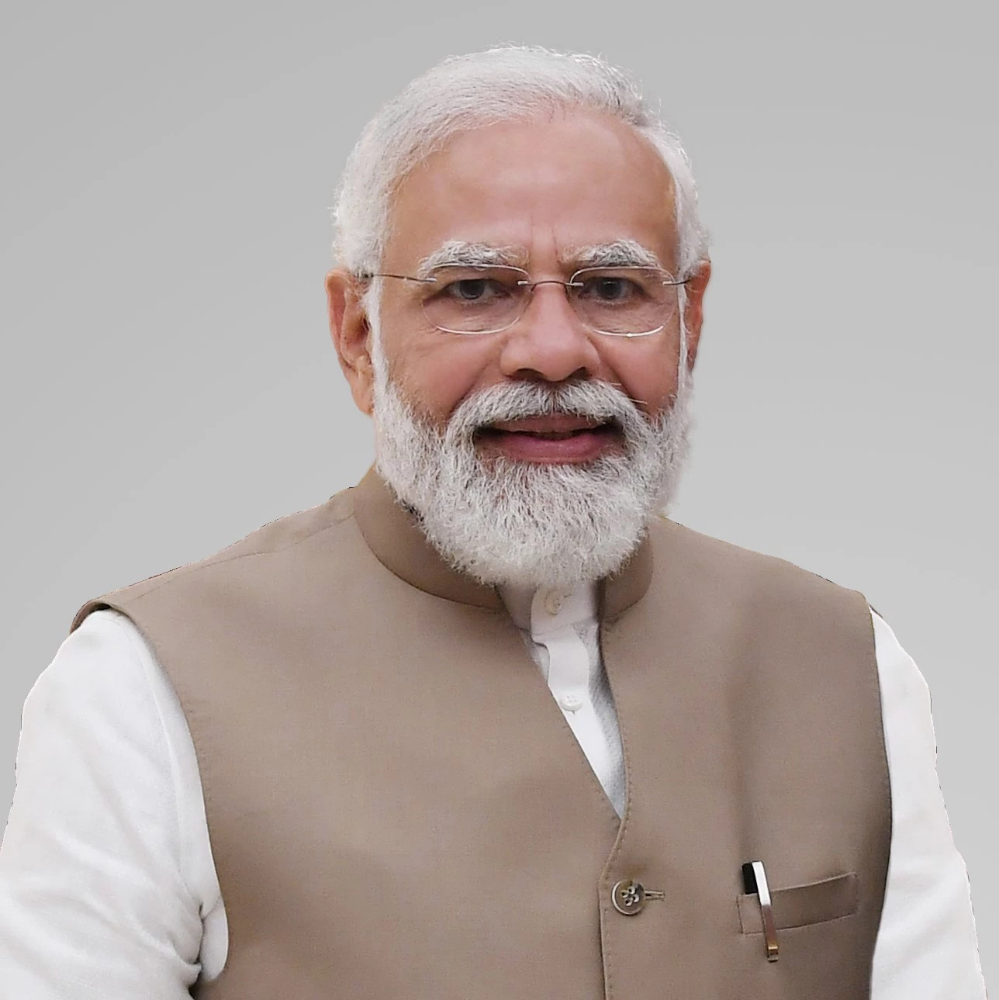

Before Blurring: Modi.webp


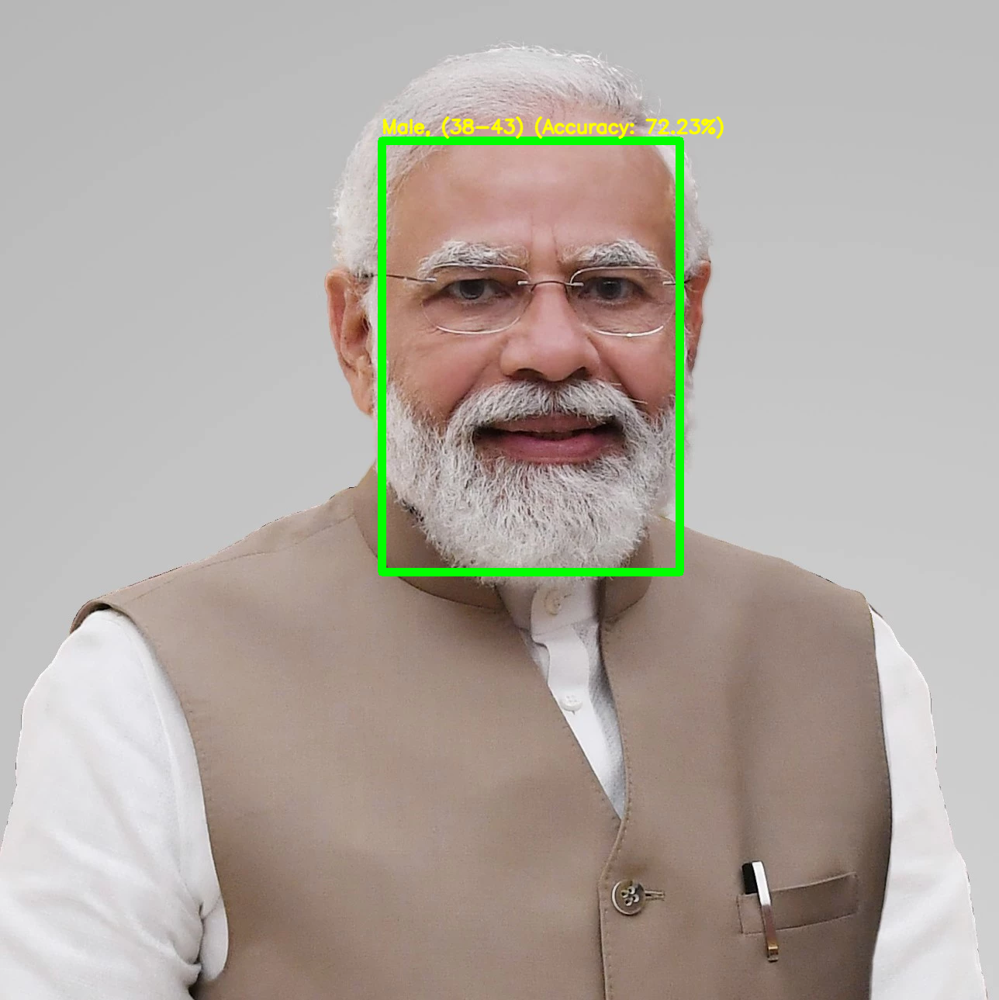

After Blurring: Modi.webp


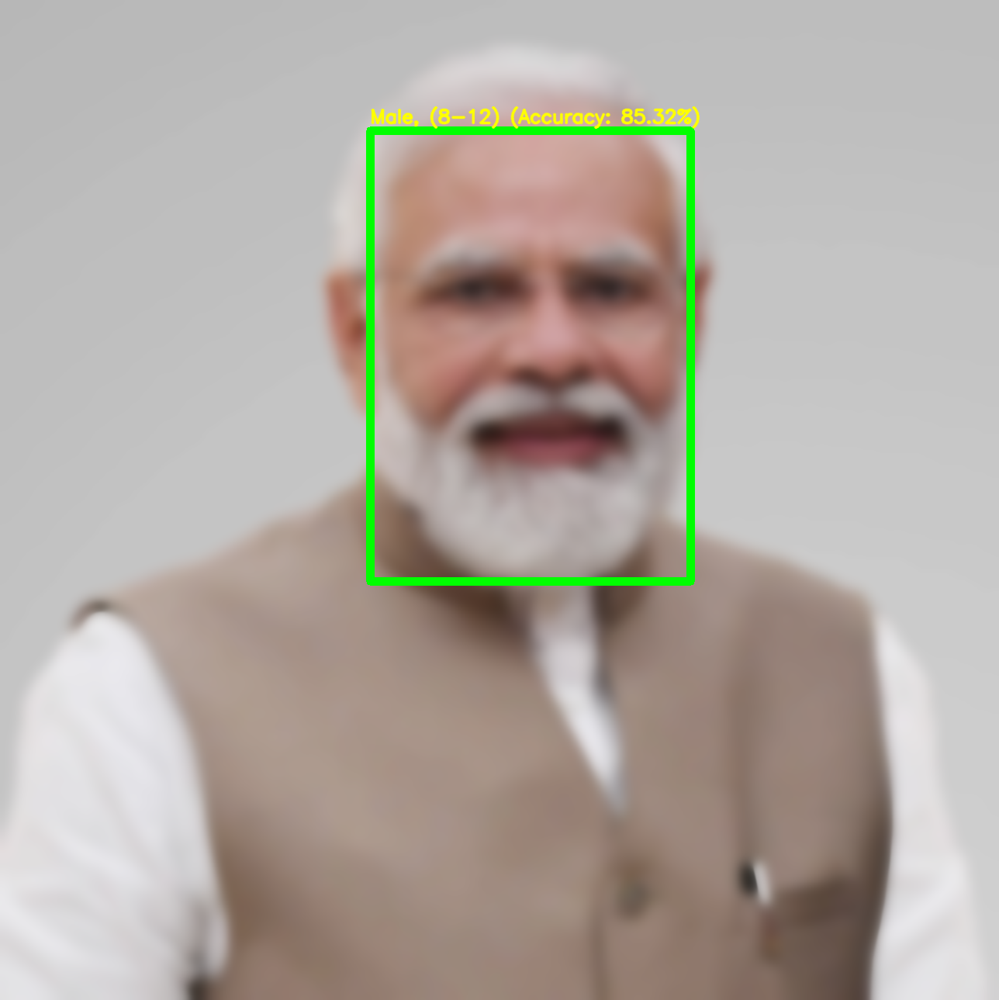

Original Image: girl1.jpg


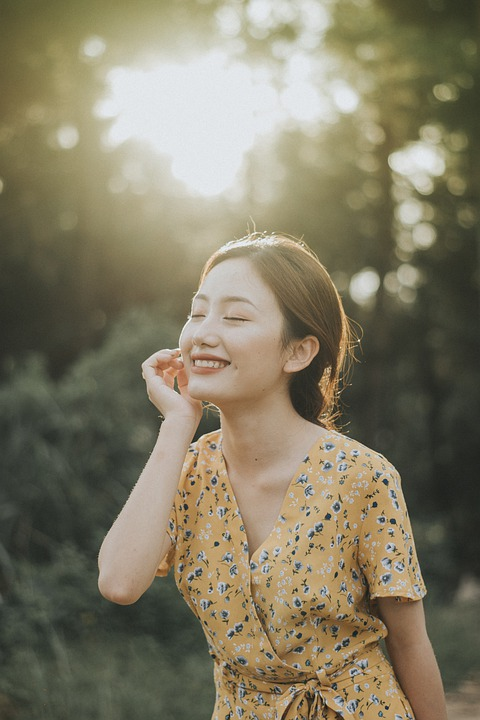

Before Blurring: girl1.jpg


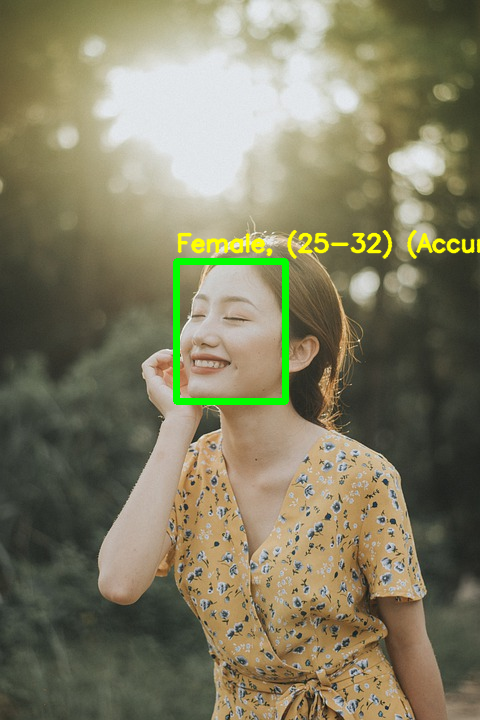

After Blurring: girl1.jpg


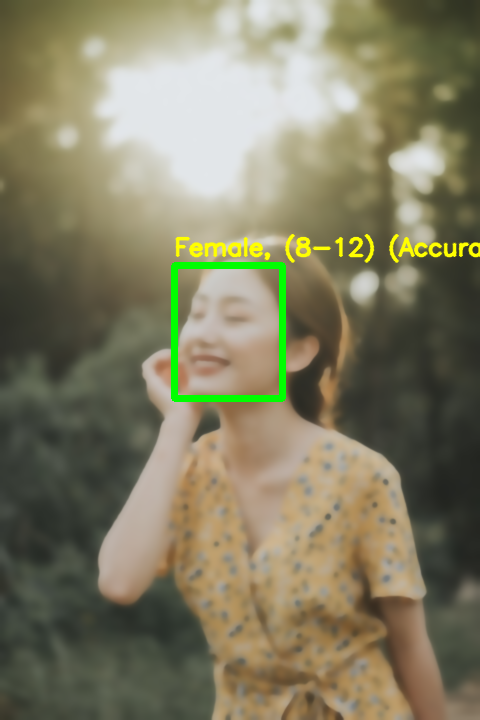

Original Image: kid1.jpg


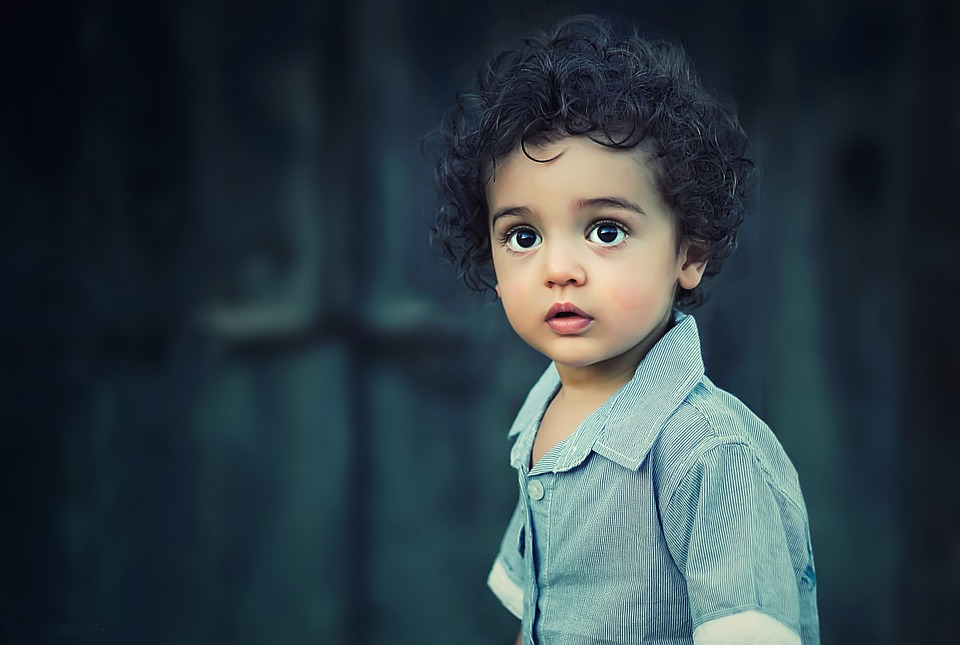

Before Blurring: kid1.jpg


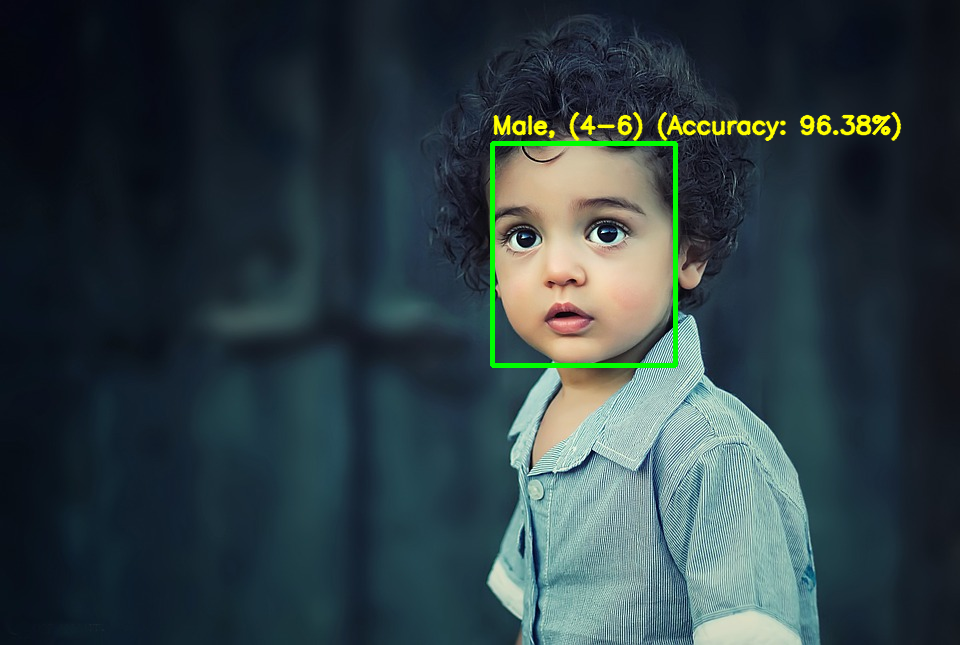

After Blurring: kid1.jpg


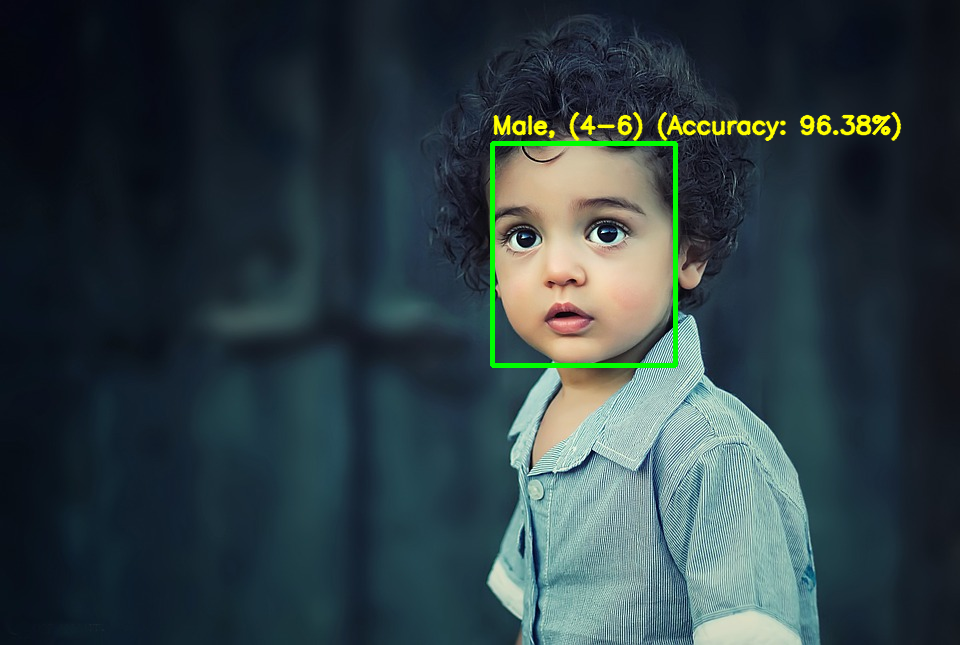


Table 1: Results Before Blurring
       Image  Gender  Gender Confidence (%)      Age  Age Confidence (%)  Accuracy (%)
1  Modi.webp    Male                  99.97  (38-43)               44.50         72.23
2  girl1.jpg  Female                  99.55  (25-32)               65.35         82.45
3   kid1.jpg    Male                 100.00    (4-6)               92.76         96.38

Table 2: Results After Blurring
        Image  Gender  Gender Confidence (%)      Age  Age Confidence (%)  Accuracy (%)
1   Modi.webp    Male                  99.97  (38-43)               35.78         67.88
2   Modi.webp    Male                  99.95  (38-43)               36.97         68.46
3   Modi.webp    Male                  99.91  (38-43)               39.95         69.93
4   Modi.webp    Male                  99.75  (38-43)               43.30         71.53
5   Modi.webp    Male                  99.43  (38-43)               42.31         70.87
6   Modi.webp    Male                  98.93  (38-43)    

In [7]:
# Import required libraries
import cv2 as cv
import time
import pandas as pd
import os
from google.colab import files
from google.colab.patches import cv2_imshow

# Initialize lists to store results for before and after blurring
results_before_blurring = []  # Stores results for all images before blurring
results_after_blurring = []   # Stores results for all images after blurring

# Function to upload multiple images
def upload_images():
    uploaded = files.upload()  # Uploading the image files
    images = []
    for filename in uploaded.keys():
        img = cv.imread(filename)  # Read each uploaded image
        images.append((img, filename))  # Append the image and filename as a tuple
    return images

def getFaceBox(net, frame, conf_threshold=0.7):
    frameOpencvDnn = frame.copy()
    frameHeight = frameOpencvDnn.shape[0]
    frameWidth = frameOpencvDnn.shape[1]
    blob = cv.dnn.blobFromImage(frameOpencvDnn, 1.0, (300, 300), [104, 117, 123], True, False)

    net.setInput(blob)
    detections = net.forward()
    bboxes = []
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > conf_threshold:
            x1 = int(detections[0, 0, i, 3] * frameWidth)
            y1 = int(detections[0, 0, i, 4] * frameHeight)
            x2 = int(detections[0, 0, i, 5] * frameWidth)
            y2 = int(detections[0, 0, i, 6] * frameHeight)
            bboxes.append([x1, y1, x2, y2])
            cv.rectangle(frameOpencvDnn, (x1, y1), (x2, y2), (0, 255, 0), int(round(frameHeight / 150)), 8)
    return frameOpencvDnn, bboxes

# Model paths
faceProto = "modelNweight/opencv_face_detector.pbtxt"
faceModel = "modelNweight/opencv_face_detector_uint8.pb"
ageProto = "modelNweight/age_deploy.prototxt"
ageModel = "modelNweight/age_net.caffemodel"
genderProto = "modelNweight/gender_deploy.prototxt"
genderModel = "modelNweight/gender_net.caffemodel"

# Mean values and labels
MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746)
ageList = ['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
genderList = ['Male', 'Female']

# Load networks
ageNet = cv.dnn.readNet(ageModel, ageProto)
genderNet = cv.dnn.readNet(genderModel, genderProto)
faceNet = cv.dnn.readNet(faceModel, faceProto)

padding = 20

def apply_blurring_techniques(image):
    # Apply Gaussian Blur
    gaussian_blurred = cv.GaussianBlur(image, (5, 5), 0)

    # Apply Bilateral Filter
    bilateral_blurred = cv.bilateralFilter(gaussian_blurred, 9, 75, 75)

    # Return the final blurred image
    return bilateral_blurred

def age_gender_detector(frame, img_name, results_list):
    # Read frame
    t = time.time()
    frameFace, bboxes = getFaceBox(faceNet, frame)

    # Initialize placeholders for predictions
    gender, age, accuracy_percentage = "", "", 0

    for bbox in bboxes:
        # Extract face region
        face = frame[max(0, bbox[1]-padding):min(bbox[3]+padding, frame.shape[0]-1),
                     max(0, bbox[0]-padding):min(bbox[2]+padding, frame.shape[1]-1)]

        # Prepare the blob for age/gender prediction
        blob = cv.dnn.blobFromImage(face, 1.0, (227, 227), MODEL_MEAN_VALUES, swapRB=False)

        # Gender prediction
        genderNet.setInput(blob)
        genderPreds = genderNet.forward()
        gender = genderList[genderPreds[0].argmax()]
        gender_confidence = genderPreds[0].max()  # Get confidence score

        # Age prediction
        ageNet.setInput(blob)
        agePreds = ageNet.forward()
        age = ageList[agePreds[0].argmax()]
        age_confidence = agePreds[0].max()  # Get confidence score

        # Calculate accuracy as the average confidence of age and gender
        accuracy = (gender_confidence + age_confidence) / 2
        accuracy_percentage = round(accuracy * 100, 2)  # Convert to percentage

        # Add result to the list
        results_list.append({
            "Image": img_name,
            "Gender": gender,
            "Gender Confidence (%)": round(gender_confidence * 100, 2),
            "Age": age,
            "Age Confidence (%)": round(age_confidence * 100, 2),
            "Accuracy (%)": accuracy_percentage
        })

        # Draw label with accuracy on the frame
        label = f"{gender}, {age} (Accuracy: {accuracy_percentage}%)"
        cv.putText(frameFace, label, (bbox[0], bbox[1]-10), cv.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 255), 2, cv.LINE_AA)

    return frameFace, accuracy_percentage

# Create a directory to store images if it doesn't exist
output_dir = "output_images"
os.makedirs(output_dir, exist_ok=True)

# Check if images are loaded correctly
input_images = upload_images()  # Upload and read the images

for input_image, input_filename in input_images:
    if input_image is None:
        print(f"Error: Could not load the image {input_filename}.")
        continue

    # Display the original input image
    print(f"Original Image: {input_filename}")
    cv2_imshow(input_image)

    # Initialize separate lists for each image
    results_before = []
    results_after = []

    # 1. Detect age and gender before applying blurring
    output_before, accuracy_before = age_gender_detector(input_image, img_name=input_filename, results_list=results_before)

    # Display the output image before blurring
    print(f"Before Blurring: {input_filename}")
    cv2_imshow(output_before)

    # Save the output image before blurring
    output_before_image_path = os.path.join(output_dir, f"before_blurring_{input_filename}")
    cv.imwrite(output_before_image_path, output_before)

    # 3. Initialize the blurred image to the input image
    blurred_image = input_image.copy()

    # 4. Repeatedly apply blurring until accuracy is above 85%
    while accuracy_before < 85:
        # Apply blurring techniques to the image
        blurred_image = apply_blurring_techniques(blurred_image)

        # 5. Detect age and gender after applying blurring
        output_after, accuracy_after = age_gender_detector(blurred_image, img_name=input_filename, results_list=results_after)

        # Store the last accuracy for comparison
        accuracy_before = accuracy_after  # Update the accuracy before next iteration

    # Ensure results are recorded after exiting the loop
    if accuracy_before >= 85:
        output_after, accuracy_after = age_gender_detector(blurred_image, img_name=input_filename, results_list=results_after)

    # Display the output image after blurring
    print(f"After Blurring: {input_filename}")
    cv2_imshow(output_after)

    # Save the output image after blurring
    output_after_image_path = os.path.join(output_dir, f"after_blurring_{input_filename}")
    cv.imwrite(output_after_image_path, output_after)

    # Add results to the appropriate lists (ensuring no duplicates)
    results_before_blurring.extend([res for res in results_before if res not in results_before_blurring])
    results_after_blurring.extend([res for res in results_after if res not in results_after_blurring])

# Convert the lists of results into DataFrames
df_before_blurring = pd.DataFrame(results_before_blurring)
df_after_blurring = pd.DataFrame(results_after_blurring)

# Remove duplicate rows from the DataFrames
df_before_blurring = df_before_blurring.drop_duplicates()
df_after_blurring = df_after_blurring.drop_duplicates()

# Add serial numbering by modifying the index
df_before_blurring.index += 1  # Start numbering from 1
df_after_blurring.index += 1  # Start numbering from 1

# Display the results in separate tables
print("\nTable 1: Results Before Blurring")
print(df_before_blurring.to_string(index=True))  # Display with index for serial numbering

print("\nTable 2: Results After Blurring")
print(df_after_blurring.to_string(index=True))  # Display with index for serial numbering

# Optionally save the DataFrames to CSV files
csv_before_blurring = os.path.join(output_dir, "age_gender_before_blurring.csv")
csv_after_blurring = os.path.join(output_dir, "age_gender_after_blurring.csv")

df_before_blurring.to_csv(csv_before_blurring, index=True)  # Save with index
df_after_blurring.to_csv(csv_after_blurring, index=True)  # Save with index

print(f"\nResults have been saved to {csv_before_blurring} and {csv_after_blurring}.")
